In [1]:
import warnings
from pathlib import Path

import iris
import matplotlib.pyplot as plt
import numpy as np
from cf_units import Unit

In [2]:
from aeolus.const import init_const

In [3]:
from util_mypaths import path_to_results
from util_plot_func import use_paper_style

In [4]:
warnings.filterwarnings("ignore", module="iris")
warnings.filterwarnings("ignore", module="aeolus")
use_paper_style()

In [5]:
# Load constants for unit conversion
consts = init_const()
avogadro_const = consts.avogadro

# WHY H2-He H2's molar mass used twice?

ABSORBERS = {
    "h2-h2": {
        "molar_mass": iris.cube.Cube(2.0158 * 2, units="g mol-1", long_name="H2-H2 molar mass"),
        "tex": "$H_2$-$H_2$ CIA",
        "color": "k",
    },
    "h2-he": {
        "molar_mass": iris.cube.Cube(
            2.0158 + 4.0026, units="g mol-1", long_name="H2-He molar mass"
        ),
        "tex": "$H_2$-$He$ CIA",
        "color": "grey",
    },
    "li": {
        "molar_mass": iris.cube.Cube(6.941, units="g mol-1", long_name="Li molar mass"),
        "tex": "$Li$",
        "color": "darkred",  # "C1",
    },
    "na": {
        "molar_mass": iris.cube.Cube(22.99, units="g mol-1", long_name="Na molar mass"),
        "tex": "$Na$",
        "color": "gold",  # "purple",
    },
    "k": {
        "molar_mass": iris.cube.Cube(39.098, units="g mol-1", long_name="K molar mass"),
        "tex": "$K$",
        "color": "#C8A2C8",  # lilac "m",
    },
    "rb": {
        "molar_mass": iris.cube.Cube(85.4678, units="g mol-1", long_name="Rb molar mass"),
        "tex": "$Rb$",
        "color": "violet",  # "b",
    },
    "cs": {
        "molar_mass": iris.cube.Cube(132.905, units="g mol-1", long_name="Cs molar mass"),
        "tex": "$Cs$",
        "color": "darkslateblue",  # "g",
    },
    "h2o": {
        "molar_mass": iris.cube.Cube(18.015, units="g mol-1", long_name="H2O molar mass"),
        "tex": "$H_2O$",
        "color": "C0",  # "c",
    },
    "co": {
        "molar_mass": iris.cube.Cube(28.01, units="g mol-1", long_name="CO molar mass"),
        "tex": "$CO$",
        "color": "C1",  # "deepskyblue",
    },
    "co2": {
        "molar_mass": iris.cube.Cube(44.01, units="g mol-1", long_name="CO2 molar mass"),
        "tex": "$CO_2$",
        "color": "C2",  # "r",
    },
    "ch4": {
        "molar_mass": iris.cube.Cube(16.04, units="g mol-1", long_name="CH4 molar mass"),
        "tex": "$CH_4$",
        "color": "C3",  # "lawngreen",
    },
    "nh3": {
        "molar_mass": iris.cube.Cube(17.031, units="g mol-1", long_name="NH3 molar mass"),
        "tex": "$NH_3$",
        "color": "C5",  # "saddlebrown",
    },
    "hcn": {
        "molar_mass": iris.cube.Cube(27.025, units="g mol-1", long_name="HCN molar mass"),
        "tex": "$HCN$",
        "color": "C4",  # "purple",
    },
}

In [6]:
# Find correct files
path_to_goyal_data = Path("/data/jgoyal/kabs")
prefixes = [f"{k}_5000_t5e-3_uw1116" for k in ABSORBERS.keys()]
flist = []
for f in list(path_to_goyal_data.glob("*.nc")):
    if f.name.startswith(tuple(prefixes)):
        if f.name.endswith("uw1116.nc"):  # to filter out _JWST.nc, _Baud.nc, _100xSolar.nc
            flist.append(f.name)
flist_sorted = [i + "_5000_t5e-3_uw1116.nc" for i in sorted(ABSORBERS.keys(), key=lambda k: flist)]

In [7]:
# Recall the range of wavenumbers used to calculate the k-terms files in path_to_goyal_data
# (this range is set in the calculation that MZ haven't seen yet)
wave_nums = np.arange(5, 50000, 10, dtype="float")
wave_nums[0] = 5.05  # Jayesh Goyal: to match ATMO bands
# Convert wavenumbers in cm to wavelengths in micrometers
wave_lens_b = 1 / wave_nums * 1e4

In [8]:
vrbls = {}
for fname, absorber in zip(flist_sorted, ABSORBERS.keys()):
    if fname.split("_")[0] == absorber:
        vrbls[absorber] = {}
        # Load data
        pres = iris.load_cube(str(path_to_goyal_data / fname), "pressure")
        temp = iris.load_cube(str(path_to_goyal_data / fname), "temperature")
        k_terms = iris.load_cube(str(path_to_goyal_data / fname), "k-term")
        weights = iris.load_cube(str(path_to_goyal_data / fname), "weights")
        # Add missing coordinates and units
        pres_temp_pair_coord = iris.coords.DimCoord(range(k_terms.shape[1]), long_name="pt_pair")
        number_of_k_terms_coord = iris.coords.DimCoord(
            range(k_terms.shape[2]), long_name="n_of_k_terms"
        )
        k_terms.add_dim_coord(pres_temp_pair_coord, 1)
        k_terms.add_dim_coord(number_of_k_terms_coord, 2)
        weights.add_dim_coord(number_of_k_terms_coord, 1)
        weights.units = Unit("1")
        # NOT SURE WHAT THE FOLLOWING THREE LINES DO BUT THEY WORK
        start_band = k_terms.coord("band").points[0] - 1
        end_band = start_band + len(k_terms.coord("band").points)
        wave_lens = wave_lens_b[start_band:end_band]
        # Assemble data
        vrbls[absorber] = {
            "pres": pres,
            "temp": temp,
            "k_terms": k_terms,
            "weights": weights,
            "wave_lens": wave_lens,
        }

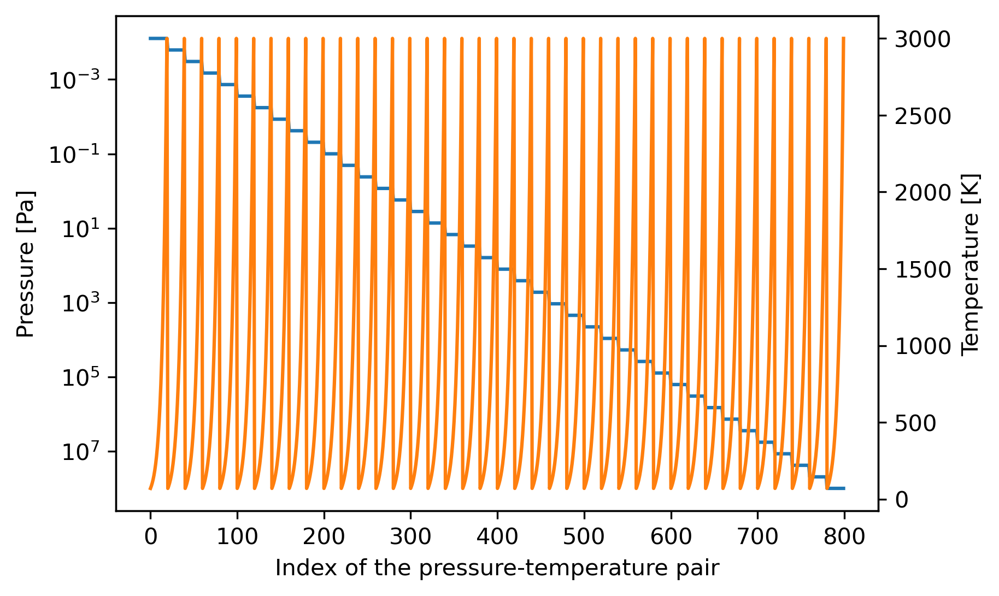

In [9]:
# Plot pressure-temperature range of the k-terms data
fig, ax = plt.subplots()
ax.plot(vrbls[absorber]["pres"].data, color="C0")
ax2 = ax.twinx()
ax2.plot(vrbls[absorber]["temp"].data, color="C1")
ax.set_yscale("log")
ax.invert_yaxis()
ax.set_xlabel("Index of the pressure-temperature pair")
ax.set_ylabel("Pressure [Pa]")
ax2.set_ylabel("Temperature [K]");

In [10]:
def find_nearest_value_and_index(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx], idx

<ipython-input-11-300a58e9d7a5>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(12, 5))


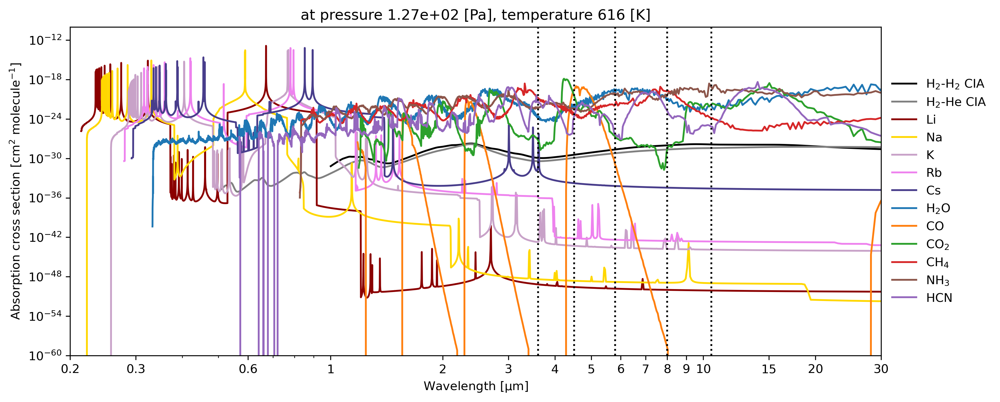

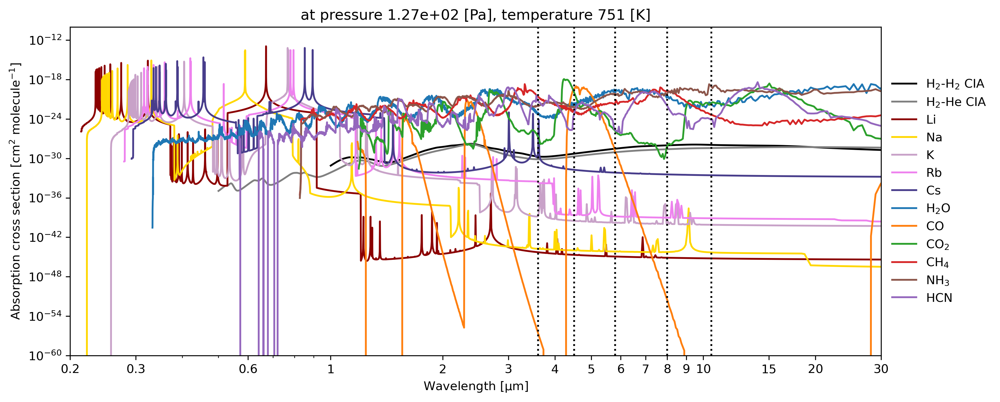

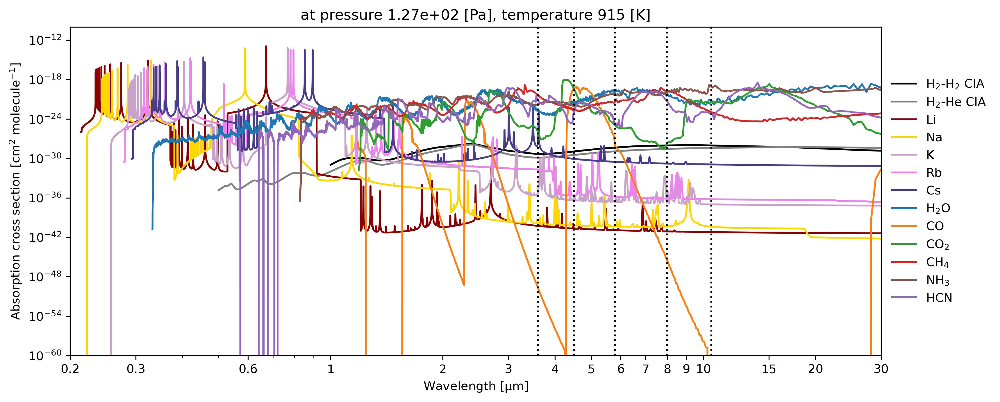

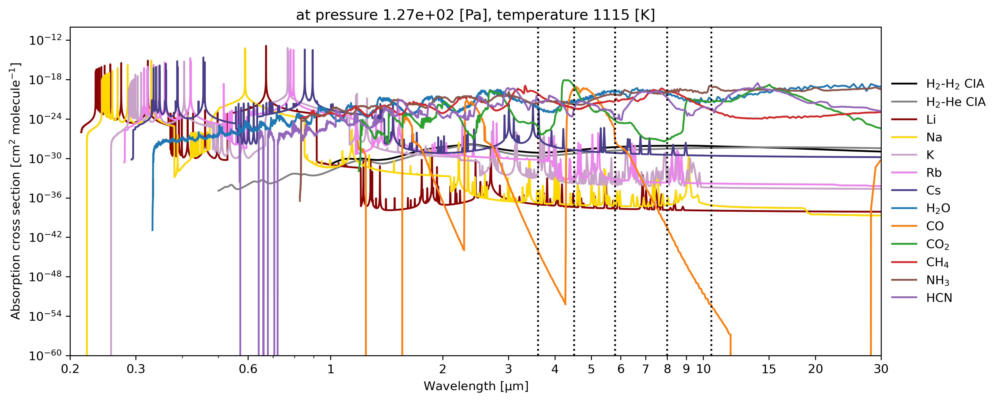

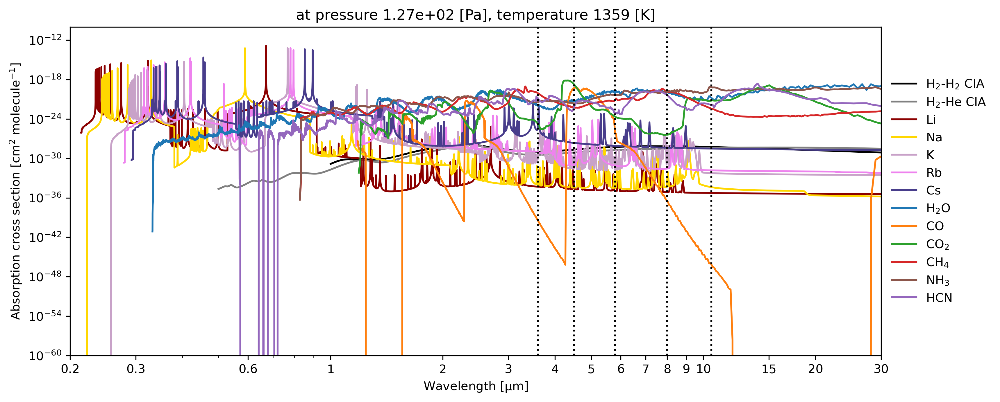

...

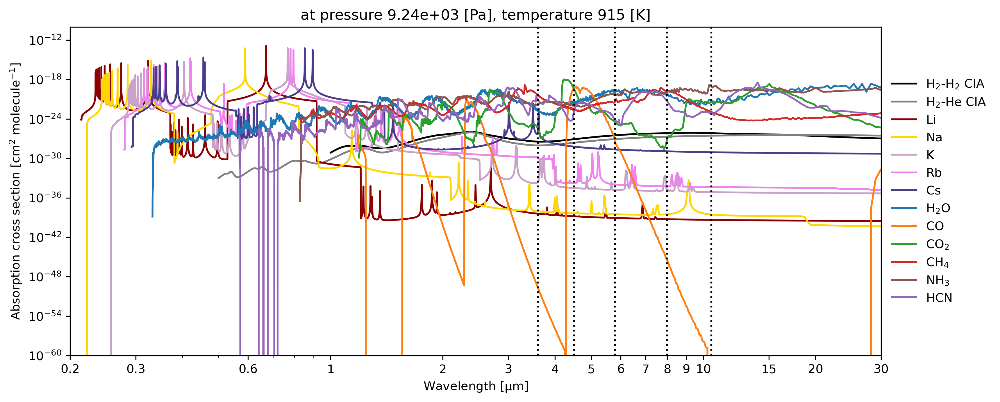

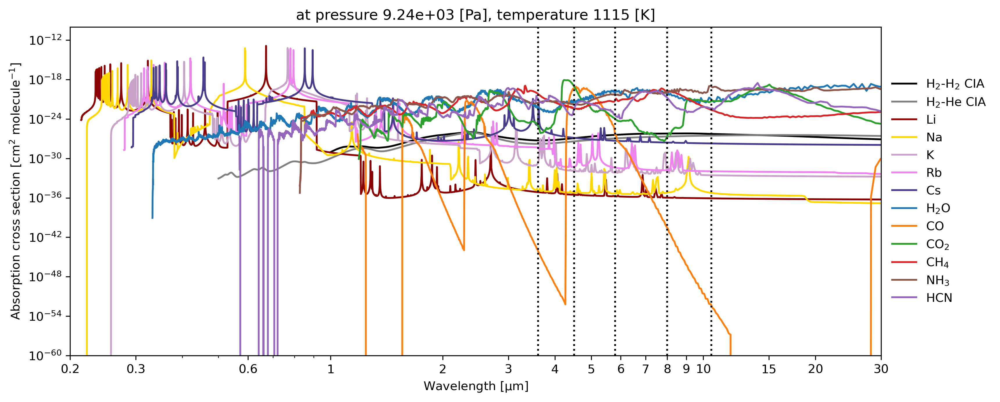

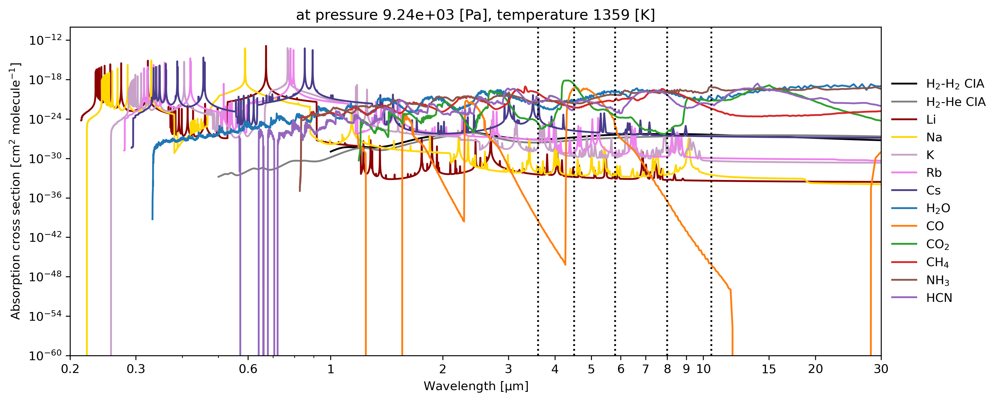

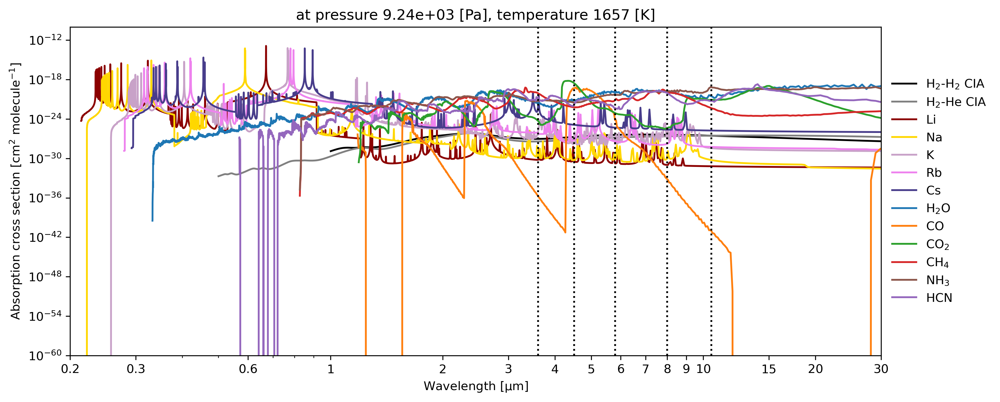

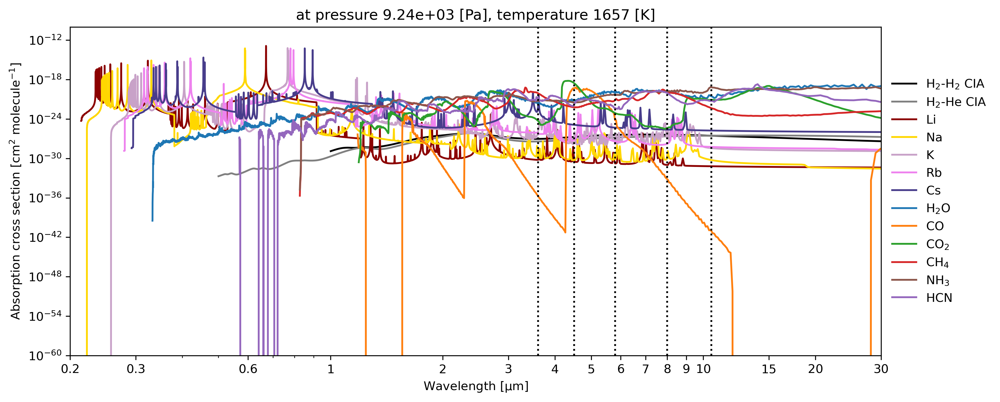

In [11]:
# Choose pressure-temperature pair
plt_pres_list = [1e2, 1e3, 1e4]  # Pa
plt_temp_list = np.arange(600, 2000, 200)  # K

for plt_pres in plt_pres_list:
    for plt_temp in plt_temp_list:
        # MZ: indicies for the pressure-temperature pairs are the same in all files
        pres_val, pres_idx = find_nearest_value_and_index(vrbls["h2-h2"]["pres"].data, plt_pres)
        temp_val, temp_idx = find_nearest_value_and_index(vrbls["h2-h2"]["temp"].data, plt_temp)
        pt_pair_idx = pres_idx + temp_idx
        # Calculate/reconstruct absorption cross sections used in ATMO RT calculations
        for absorber in ABSORBERS.keys():
            absorption_cross_section = (
                (
                    (
                        vrbls[absorber]["weights"] * vrbls[absorber]["k_terms"][:, pt_pair_idx, :]
                    ).collapsed("n_of_k_terms", iris.analysis.SUM)
                )
                * (ABSORBERS[absorber]["molar_mass"])
                / avogadro_const
            )
            # Real units here are cm2 molecule-1
            # MZ converts to cm2 because aeolus doesn't have molecules as units in the Avogadro number
            absorption_cross_section.convert_units("cm2")
            vrbls[absorber].update({"absorption_cross_section": absorption_cross_section})
        # Plot
        fig, ax = plt.subplots(figsize=(12, 5))
        for absorber in ABSORBERS.keys():
            #     if absorber not in ["hcn", "rb", "cs"]:
            ax.plot(
                vrbls[absorber]["wave_lens"],
                vrbls[absorber]["absorption_cross_section"].data,
                label=ABSORBERS[absorber]["tex"],
                color=ABSORBERS[absorber]["color"],
            )
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_title(
            f"at pressure {pres_val:0.2e} [Pa], temperature {int(temp_val)} [K]"
        )
        ax.set_xlabel("Wavelength [$\mu$m]")
        ax.set_ylabel("Absorption cross section [$cm^2$ $molecule^{-1}$]")
        ax.legend(frameon=False, loc="center left", bbox_to_anchor=(1, 0.5))
        # Spitzer/IRAC channels and 10.5 micrometers
        ax.axvline(x=3.6, color="k", linestyle="dotted")
        ax.axvline(x=4.5, color="k", linestyle="dotted")
        ax.axvline(x=5.8, color="k", linestyle="dotted")
        ax.axvline(x=8.0, color="k", linestyle="dotted")
        ax.axvline(x=10.5, color="k", linestyle="dotted")

        # For JWST
        xticks = np.concatenate(
            [np.array([0.2, 0.3, 0.6]), np.arange(1, 10, 1), np.array([10, 15, 20, 30])]
        )
        ax.set_xlim(0.2, 30)
        ax.set_ylim(1e-60, 1e-10)
        # For Spitzer
        #         xticks = np.arange(3, 11, 1)
        #         ax.set_xlim(3, 10)
        #         ax.set_ylim(1e-60, 1e-10)
        # To reproduce Goyal et al. (2020) MNRAS Figure 2
        #         xticks = [0.3, 0.6, 1, 1.4, 2, 3, 4, 6, 8, 12]
        #         ax.set_xlim(0.2, 12)

        ax.set_xticks(xticks)
        # Comment next line out when using widgets
        ax.set_xticklabels([int(i) if i >= 1 else i for i in xticks])

        fig.savefig(
            path_to_results
            / "absorption_cross_sections"
            / "for_jwst_range"
            #             / "for_spitzer_range"
            / f"absorption_cross_section_pres{pres_val:0.2e}Pa_temp{int(temp_val)}K.png",
        )